In [1]:
import numpy as np
from tqdm import tqdm
from pathlib import Path

import keras
import keras.backend as K
from keras.initializers import RandomNormal

from keras.layers import Input, Dense, Activation, LeakyReLU, BatchNormalization, Dropout
from keras.layers import Conv2D, Conv2DTranspose, Reshape, Flatten

from keras.models import Model

from keras.optimizers import Adam

from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
%matplotlib inline
from keras.datasets import cifar10






D:\Anaconda\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

In [3]:
#import tensorflow as tf
#with tf.Session() as sess:
#  devices = sess.list_devices()
#  print(devices)

In [4]:
train_dir = Path('C:/Users/npurk/Desktop/GAN/CelebA_subset/')
dir_save = 'C:/Users/npurk/Desktop/GAN/CelebA_subset/'

In [5]:
x_train = x_train[y_train.flatten() == 1]

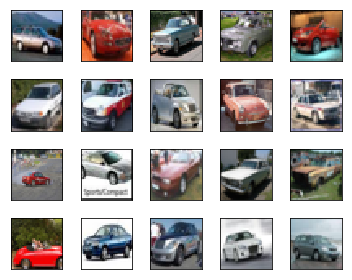

In [6]:
# Plot many
plt.figure(figsize=(5, 4))
for i in range(20):
    plt.subplot(4, 5, i+1)
    plt.imshow(x_train[i].reshape(32,32,3), cmap='gray')
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

In [7]:
# Check shape

x_train.shape, x_test.shape

((5000, 32, 32, 3), (10000, 32, 32, 3))

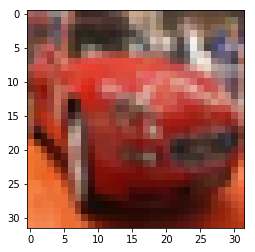

In [8]:
plt.imshow(x_train[1])

In [9]:
def preprocess(x):
    return (x/255)*2-1

def deprocess(x):
    return np.uint8((x+1)/2*255)


In [10]:
X_train_real = preprocess(x_train)
X_test_real  = preprocess(x_test)


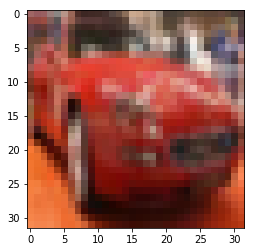

In [11]:
plt.imshow(deprocess(X_train_real[1]))

In [12]:
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D


# Input Placeholder
def gen(latent_dim, leaky_alpha, init_stddev ):
    input_img = Input(shape=(latent_dim,))  # adapt this if using `channels_first` image data format

    # Encoder part
    x = Dense(32*32*3)(input_img)
    x = Reshape((4, 4, 192))(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=leaky_alpha)(x)
    x = Conv2DTranspose(256, kernel_size=5, strides=2, padding='same',
                       kernel_initializer=RandomNormal(stddev=init_stddev))(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=leaky_alpha)(x)
    
    x = Conv2DTranspose(128, kernel_size=5, strides=2, padding='same',
                       kernel_initializer=RandomNormal(stddev=init_stddev))(x)

    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=leaky_alpha)(x)
    
    x = Conv2DTranspose(3, kernel_size=5, strides=2, padding='same',
                          kernel_initializer=RandomNormal(stddev=init_stddev), activation='tanh')(x)
    generator = Model(input_img, x)
    generator.summary()
    
    return generator

In [13]:
u = gen(20,0.01,0.02)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 20)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 3072)              64512     
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 192)         0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 4, 4, 192)         768       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 4, 4, 192)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 8, 8, 256)         1229056   
_________________________________________________________________
batch_normalization_2 (Batch (None, 8, 8, 256)         1024      
__________

In [14]:

def disc(leaky_alpha, init_stddev):
    disc_input = Input(shape=(32,32,3)) 
    
    x = Conv2D(64, kernel_size=5, strides=2, padding='same',  
               kernel_initializer=RandomNormal(stddev=init_stddev))(disc_input)
    
    x = LeakyReLU(alpha=leaky_alpha)(x)
    
    x = Conv2D(128, kernel_size=5, strides=2, padding='same',
               kernel_initializer=RandomNormal(stddev=init_stddev))(x)
    
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=leaky_alpha)(x)
    
    x = Conv2D(256,kernel_size=5, strides=2, padding='same',
               kernel_initializer=RandomNormal(stddev=init_stddev))(x)
    
    x = BatchNormalization(momentum=0.8)(x)
    
    x = LeakyReLU(alpha=leaky_alpha)(x)

    x = Flatten()(x)
    x = Dropout(0.2)(x)
    x = Dense(1, activation='sigmoid')(x)
    discriminator = Model(disc_input, x)
    discriminator.summary()
    
    return discriminator


kaek = disc(0.01, 0.02)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
batch_normalization_4 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 256)         819456    
__________

In [15]:
    #discriminator_optimizer = keras.optimizers.RMSprop(
    #lr=0.0008,
    #clipvalue=1.0,
    #decay=1e-8)
    


In [16]:
# beta_1 is the exponential decay rate for the 1st moment estimates in Adam optimizer
def make_DCGAN(sample_size, 
               g_learning_rate,
               g_beta_1,
               d_learning_rate,
               d_beta_1,
               leaky_alpha,
               init_std):
    # clear first
    K.clear_session()
    
    # generator
    generator = gen(sample_size, leaky_alpha, init_std)

    # discriminator
    discriminator = disc(leaky_alpha, init_std)
    discriminator_optimizer = Adam(lr=d_learning_rate, beta_1=d_beta_1) #keras.optimizers.RMSprop(lr=d_learning_rate, clipvalue=1.0, decay=1e-8) 
    discriminator.compile(optimizer=discriminator_optimizer, loss='binary_crossentropy')
    
    # GAN
    gan = Sequential([generator, discriminator])
    gan_optimizer = Adam(lr=g_learning_rate, beta_1=g_beta_1) #keras.optimizers.RMSprop(lr=g_learning_rate, clipvalue=1.0, decay=1e-8)
    gan.compile(optimizer=gan_optimizer, loss='binary_crossentropy')
    
    return generator, discriminator, gan

In [17]:
########$%$############

def make_latent_samples(n_samples, sample_size):
    #return np.random.uniform(-1, 1, size=(n_samples, sample_size))
    return np.random.normal(loc=0, scale=1, size=(n_samples, sample_size))

In [18]:
def make_trainable(model, trainable):
    for layer in model.layers:
        layer.trainable = trainable

In [19]:
def make_labels(size):
    return np.ones([size, 1]), np.zeros([size, 1])

In [20]:
def show_results(losses):
    labels = ['Classifier', 'Discriminator', 'Generator']
    losses = np.array(losses)    
    
    fig, ax = plt.subplots()
    plt.plot(losses.T[0], label='Discriminator Net')
    plt.plot(losses.T[1], label='Generator Net')
    plt.title("Losses during training")
    plt.legend()
    plt.show()

In [21]:
def show_images(generated_images):
    n_images = len(generated_images)
    rows = 4
    cols = n_images//rows
    
    plt.figure(figsize=(cols, rows))
    for i in range(n_images):
        img = deprocess(generated_images[i])
        plt.subplot(rows, cols, i+1)
        plt.imshow(img, cmap='gray')
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout()
    plt.show()

In [22]:
def train(
    g_learning_rate,   # learning rate for the generator
    g_beta_1,          # the exponential decay rate for the 1st moment estimates in Adam optimizer
    d_learning_rate,   # learning rate for the discriminator
    d_beta_1,          # the exponential decay rate for the 1st moment estimates in Adam optimizer
    leaky_alpha,
    init_std,
    smooth=0.1,        # label smoothing
    sample_size=100,   # latent sample size (i.e. 100 random numbers)
    epochs=200,
    batch_size=128,    # train batch size
    eval_size=16):      # evaluate size
    
    # labels for the batch size and the test size
    y_train_real, y_train_fake = make_labels(batch_size)
    y_eval_real,  y_eval_fake  = make_labels(eval_size)

    # create a GAN, a generator and a discriminator
    generator, discriminator, gan = make_DCGAN(
        sample_size, 
        g_learning_rate, 
        g_beta_1,
        d_learning_rate,
        d_beta_1,
        leaky_alpha,
        init_std)

    losses = []
    for epoch_indx in range(epochs):
        for i in tqdm(range(len(X_train_real)//batch_size)):
            # real images
            X_batch_real = X_train_real[i*batch_size:(i+1)*batch_size]

            # latent samples and the generated images
            latent_samples = make_latent_samples(batch_size, sample_size)
            X_batch_fake = generator.predict_on_batch(latent_samples)

            # train the discriminator to detect real and fake images
            make_trainable(discriminator, True)
            discriminator.train_on_batch(X_batch_real, y_train_real * (1 - smooth))
            discriminator.train_on_batch(X_batch_fake, y_train_fake)

            # train the generator via GAN
            make_trainable(discriminator, False)
            gan.train_on_batch(latent_samples, y_train_real)

        # evaluate
        X_eval_real = X_test_real[np.random.choice(len(X_test_real), eval_size, replace=False)]

        latent_samples = make_latent_samples(eval_size, sample_size)
        X_eval_fake = generator.predict_on_batch(latent_samples)

        d_loss  = discriminator.test_on_batch(X_eval_real, y_eval_real)
        d_loss += discriminator.test_on_batch(X_eval_fake, y_eval_fake)
        g_loss  = gan.test_on_batch(latent_samples, y_eval_real) # we want the fake to be realistic!

        losses.append((d_loss, g_loss))

        print("At epoch:{:>3}/{},\nDiscriminator Loss:{:>7.4f} \nGenerator Loss:{:>7.4f}".format(
            epoch_indx+1, epochs, d_loss, g_loss))
        
        if (epoch_indx+1)%1==0:
            show_images(X_eval_fake)
    
    show_results(losses)
    return generator

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 3072)              310272    
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 192)         0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 4, 4, 192)         768       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 4, 4, 192)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 8, 8, 256)         1229056   
_________________________________________________________________
batch_normalization_2 (Batch (None, 8, 8, 256)         1024      
__________

  0%|                                                                                           | 0/39 [00:00<?, ?it/s]D:\Anaconda\lib\site-packages\keras\engine\training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:17<00:00,  4.79it/s]


At epoch:  1/200,
Discriminator Loss: 1.5402 
Generator Loss: 4.5400


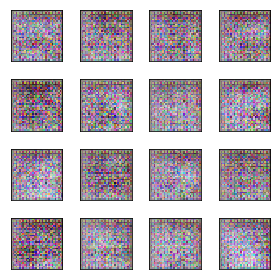

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.24it/s]


At epoch:  2/200,
Discriminator Loss: 1.0215 
Generator Loss: 3.0159


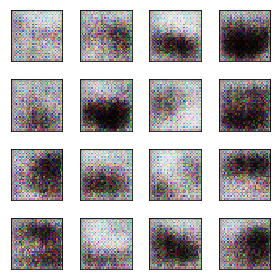

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.78it/s]


At epoch:  3/200,
Discriminator Loss: 3.6251 
Generator Loss: 7.2238


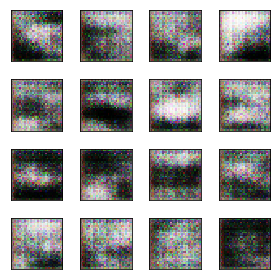

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.70it/s]


At epoch:  4/200,
Discriminator Loss: 2.5860 
Generator Loss: 4.0416


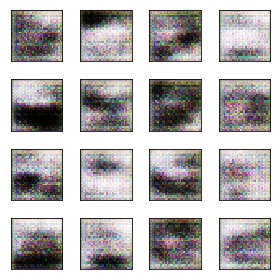

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.76it/s]


At epoch:  5/200,
Discriminator Loss: 2.0271 
Generator Loss: 4.5053


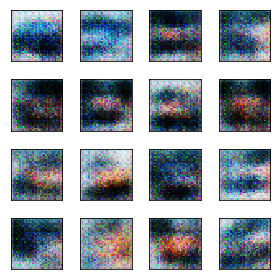

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.83it/s]


At epoch:  6/200,
Discriminator Loss: 1.9601 
Generator Loss: 4.1293


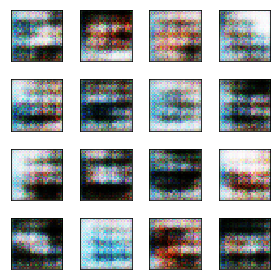

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.80it/s]


At epoch:  7/200,
Discriminator Loss: 1.2929 
Generator Loss: 3.1791


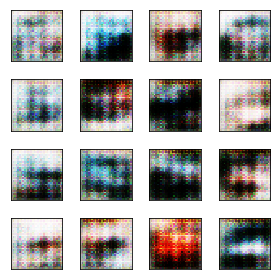

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.66it/s]


At epoch:  8/200,
Discriminator Loss: 2.0249 
Generator Loss: 3.9433


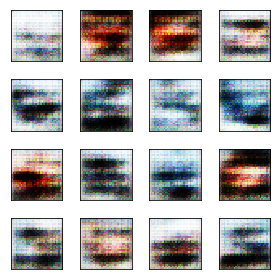

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.74it/s]


At epoch:  9/200,
Discriminator Loss: 1.3815 
Generator Loss: 4.7377


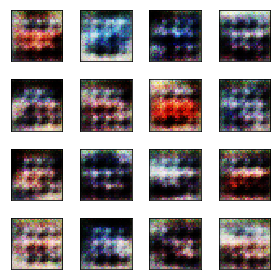

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.01it/s]


At epoch: 10/200,
Discriminator Loss: 1.1431 
Generator Loss: 3.8982


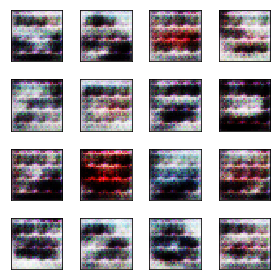

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.76it/s]


At epoch: 11/200,
Discriminator Loss: 2.5074 
Generator Loss: 4.0565


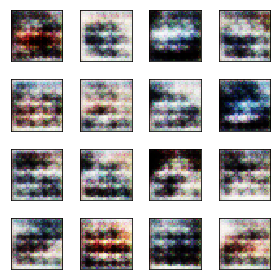

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.20it/s]


At epoch: 12/200,
Discriminator Loss: 1.8076 
Generator Loss: 5.0149


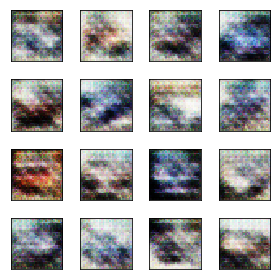

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  3.39it/s]


At epoch: 13/200,
Discriminator Loss: 1.8583 
Generator Loss: 3.0827


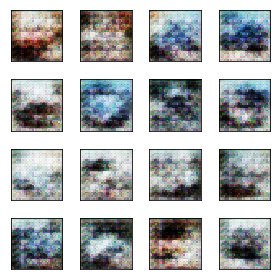

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.26it/s]


At epoch: 14/200,
Discriminator Loss: 1.1352 
Generator Loss: 2.5135


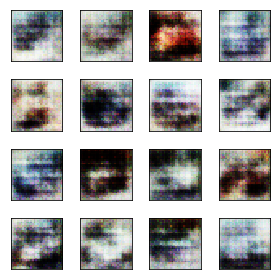

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.59it/s]


At epoch: 15/200,
Discriminator Loss: 2.9975 
Generator Loss: 4.0742


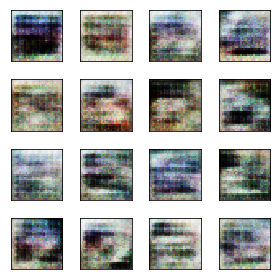

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.53it/s]


At epoch: 16/200,
Discriminator Loss: 2.7306 
Generator Loss: 4.4577


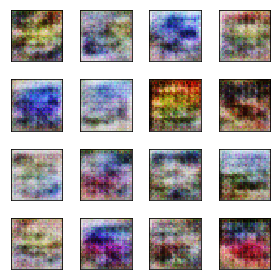

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.56it/s]


At epoch: 17/200,
Discriminator Loss: 1.3151 
Generator Loss: 2.3425


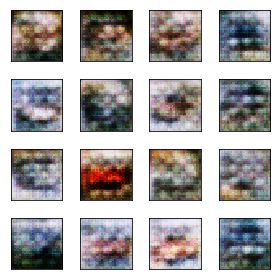

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.61it/s]


At epoch: 18/200,
Discriminator Loss: 3.3305 
Generator Loss: 3.2115


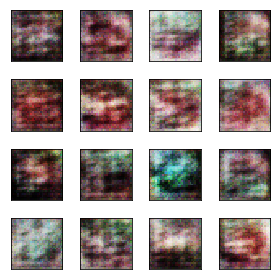

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.40it/s]


At epoch: 19/200,
Discriminator Loss: 1.9149 
Generator Loss: 3.3147


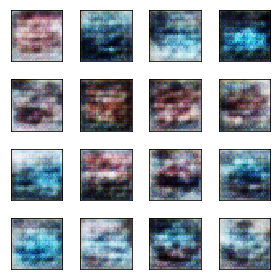

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.72it/s]


At epoch: 20/200,
Discriminator Loss: 2.1619 
Generator Loss: 5.0249


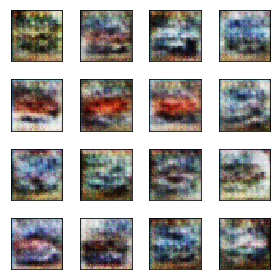

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.55it/s]


At epoch: 21/200,
Discriminator Loss: 1.9048 
Generator Loss: 3.8955


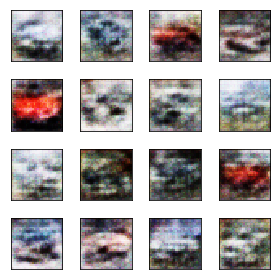

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.57it/s]


At epoch: 22/200,
Discriminator Loss: 2.4050 
Generator Loss: 4.8059


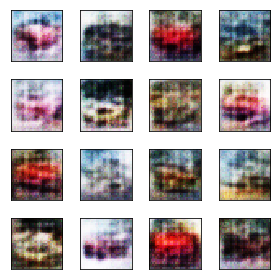

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.74it/s]


At epoch: 23/200,
Discriminator Loss: 2.6097 
Generator Loss: 3.7845


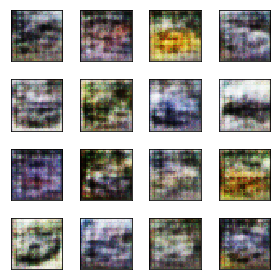

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.79it/s]


At epoch: 24/200,
Discriminator Loss: 2.4143 
Generator Loss: 4.5671


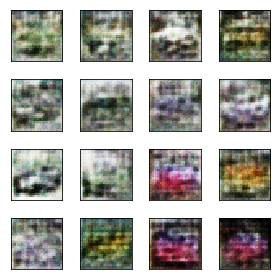

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.40it/s]


At epoch: 25/200,
Discriminator Loss: 2.7293 
Generator Loss: 4.0698


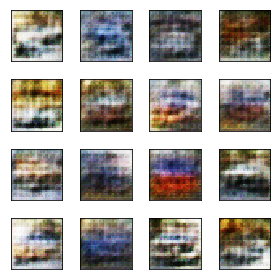

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.90it/s]


At epoch: 26/200,
Discriminator Loss: 2.2644 
Generator Loss: 3.7310


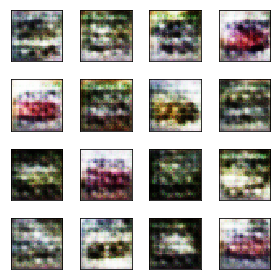

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.33it/s]


At epoch: 27/200,
Discriminator Loss: 2.3070 
Generator Loss: 3.8888


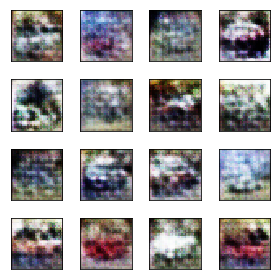

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.49it/s]


At epoch: 28/200,
Discriminator Loss: 1.8081 
Generator Loss: 2.9703


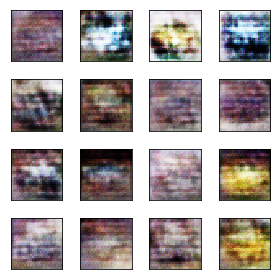

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.31it/s]


At epoch: 29/200,
Discriminator Loss: 1.5154 
Generator Loss: 3.0100


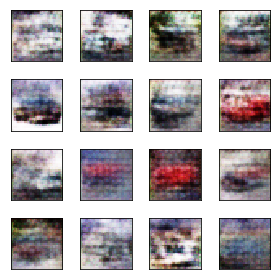

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.37it/s]


At epoch: 30/200,
Discriminator Loss: 1.7069 
Generator Loss: 3.8796


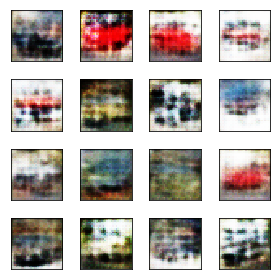

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.66it/s]


At epoch: 31/200,
Discriminator Loss: 1.5590 
Generator Loss: 3.1474


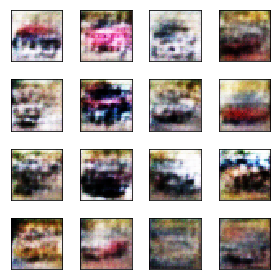

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.87it/s]


At epoch: 32/200,
Discriminator Loss: 2.8390 
Generator Loss: 4.2971


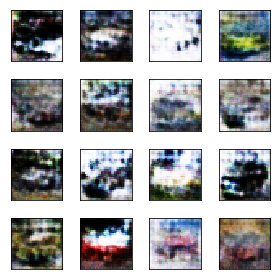

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.93it/s]


At epoch: 33/200,
Discriminator Loss: 2.0580 
Generator Loss: 3.9593


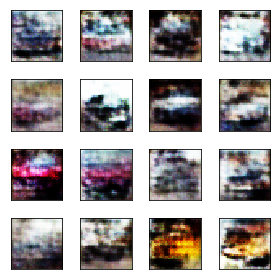

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.65it/s]


At epoch: 34/200,
Discriminator Loss: 2.3647 
Generator Loss: 4.1449


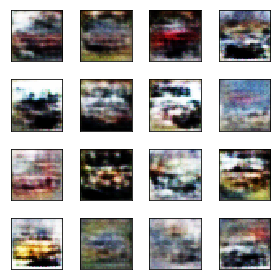

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.33it/s]


At epoch: 35/200,
Discriminator Loss: 1.5524 
Generator Loss: 3.3996


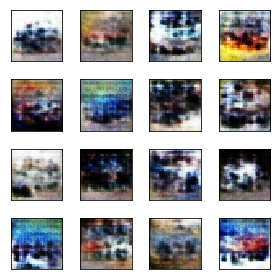

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.51it/s]


At epoch: 36/200,
Discriminator Loss: 1.3989 
Generator Loss: 2.8981


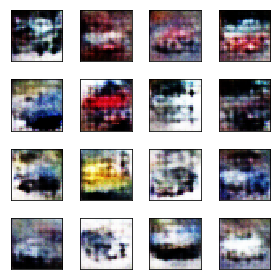

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.51it/s]


At epoch: 37/200,
Discriminator Loss: 2.4694 
Generator Loss: 3.3058


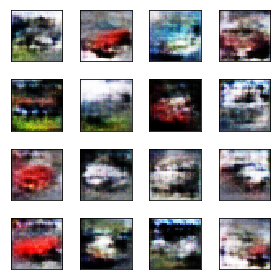

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  4.71it/s]


At epoch: 38/200,
Discriminator Loss: 1.5379 
Generator Loss: 3.7514


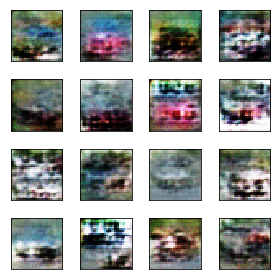

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.21it/s]


At epoch: 39/200,
Discriminator Loss: 2.2868 
Generator Loss: 4.2662


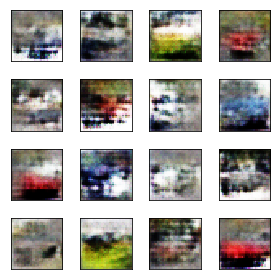

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.51it/s]


At epoch: 40/200,
Discriminator Loss: 1.6992 
Generator Loss: 3.4494


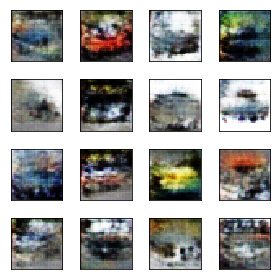

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.33it/s]


At epoch: 41/200,
Discriminator Loss: 1.8372 
Generator Loss: 3.7323


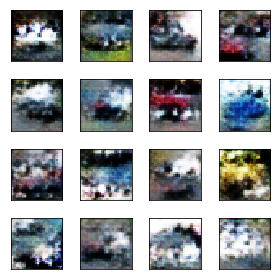

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.04it/s]


At epoch: 42/200,
Discriminator Loss: 2.5917 
Generator Loss: 5.4821


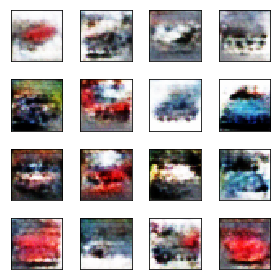

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.46it/s]


At epoch: 43/200,
Discriminator Loss: 1.7747 
Generator Loss: 3.2037


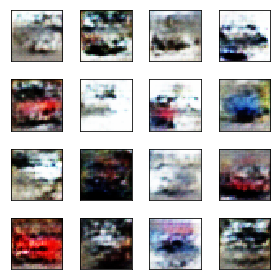

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.75it/s]


At epoch: 44/200,
Discriminator Loss: 2.2877 
Generator Loss: 4.5165


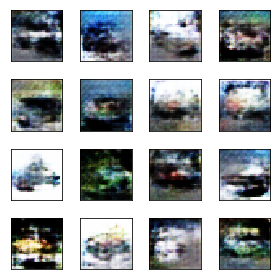

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.34it/s]


At epoch: 45/200,
Discriminator Loss: 1.1218 
Generator Loss: 3.9293


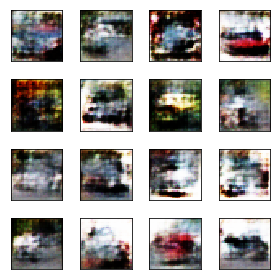

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.62it/s]


At epoch: 46/200,
Discriminator Loss: 2.5123 
Generator Loss: 4.2218


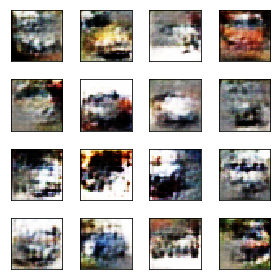

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  3.86it/s]


At epoch: 47/200,
Discriminator Loss: 2.7383 
Generator Loss: 4.3177


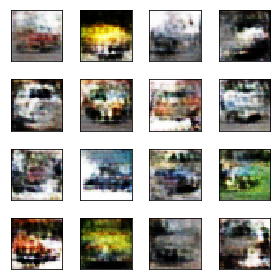

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.65it/s]


At epoch: 48/200,
Discriminator Loss: 0.8599 
Generator Loss: 3.5439


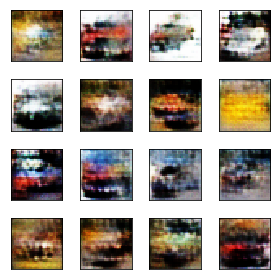

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.44it/s]


At epoch: 49/200,
Discriminator Loss: 1.8553 
Generator Loss: 3.8404


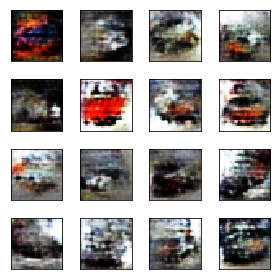

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.47it/s]


At epoch: 50/200,
Discriminator Loss: 2.8452 
Generator Loss: 3.9706


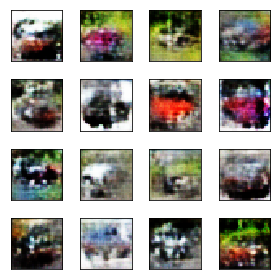

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.26it/s]


At epoch: 51/200,
Discriminator Loss: 2.5334 
Generator Loss: 4.4287


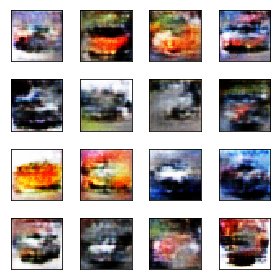

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.63it/s]


At epoch: 52/200,
Discriminator Loss: 1.2302 
Generator Loss: 1.8339


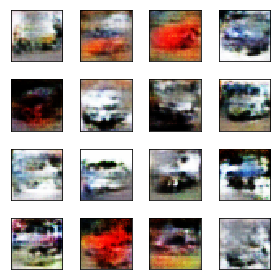

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.17it/s]


At epoch: 53/200,
Discriminator Loss: 1.5399 
Generator Loss: 3.6539


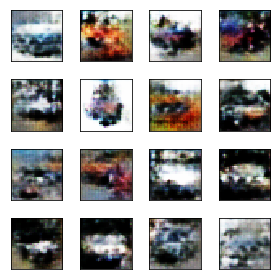

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.03it/s]


At epoch: 54/200,
Discriminator Loss: 1.9164 
Generator Loss: 3.4513


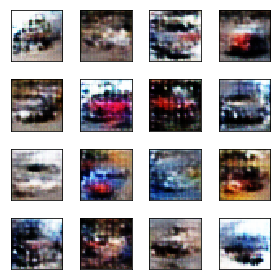

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.63it/s]


At epoch: 55/200,
Discriminator Loss: 2.1255 
Generator Loss: 3.4757


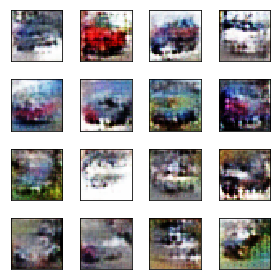

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.49it/s]


At epoch: 56/200,
Discriminator Loss: 2.2016 
Generator Loss: 3.9613


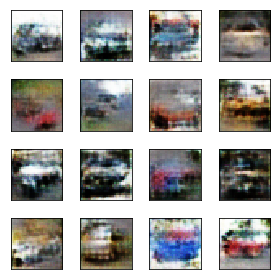

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.27it/s]


At epoch: 57/200,
Discriminator Loss: 2.0400 
Generator Loss: 3.6635


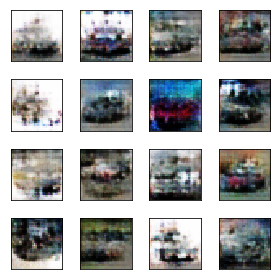

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.22it/s]


At epoch: 58/200,
Discriminator Loss: 3.3834 
Generator Loss: 4.8711


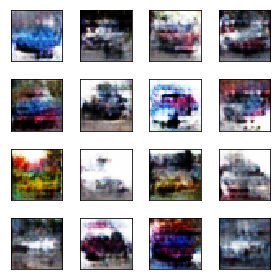

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.38it/s]


At epoch: 59/200,
Discriminator Loss: 1.9285 
Generator Loss: 4.2749


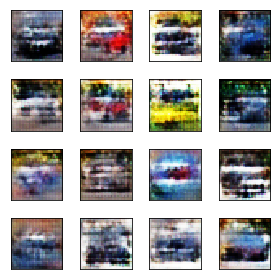

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.11it/s]


At epoch: 60/200,
Discriminator Loss: 2.8212 
Generator Loss: 3.8841


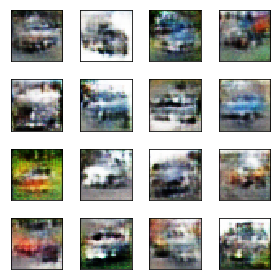

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.15it/s]


At epoch: 61/200,
Discriminator Loss: 2.0377 
Generator Loss: 3.9561


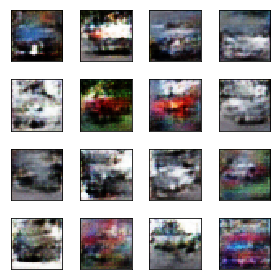

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.68it/s]


At epoch: 62/200,
Discriminator Loss: 2.2469 
Generator Loss: 4.4390


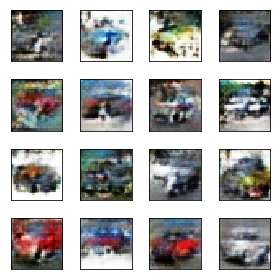

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.72it/s]


At epoch: 63/200,
Discriminator Loss: 2.5443 
Generator Loss: 4.6717


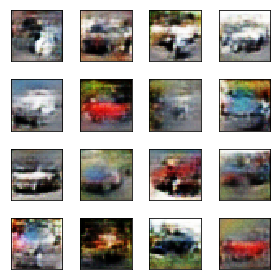

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.76it/s]


At epoch: 64/200,
Discriminator Loss: 2.2135 
Generator Loss: 3.9008


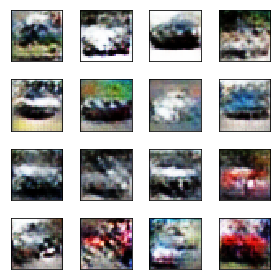

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.64it/s]


At epoch: 65/200,
Discriminator Loss: 2.2045 
Generator Loss: 3.9139


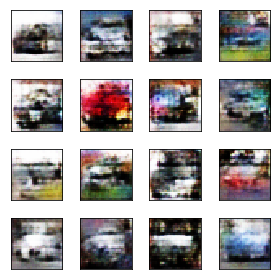

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.67it/s]


At epoch: 66/200,
Discriminator Loss: 2.9748 
Generator Loss: 4.4222


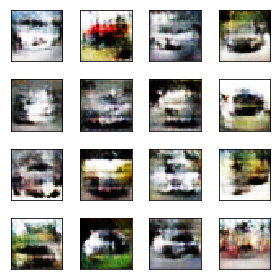

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.46it/s]


At epoch: 67/200,
Discriminator Loss: 2.4511 
Generator Loss: 4.3012


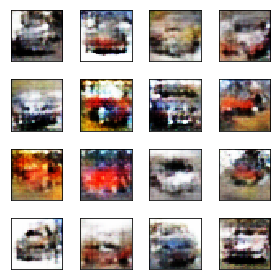

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.79it/s]


At epoch: 68/200,
Discriminator Loss: 2.3768 
Generator Loss: 4.9093


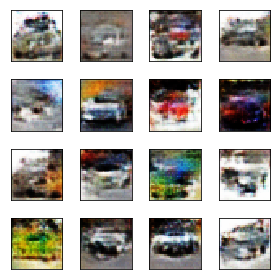

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.67it/s]


At epoch: 69/200,
Discriminator Loss: 3.4959 
Generator Loss: 7.5647


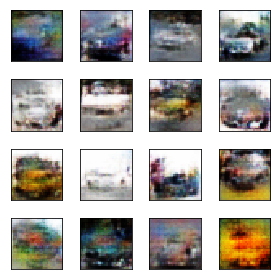

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.58it/s]


At epoch: 70/200,
Discriminator Loss: 2.2438 
Generator Loss: 3.3886


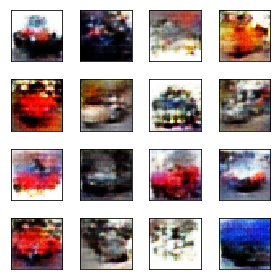

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.60it/s]


At epoch: 71/200,
Discriminator Loss: 2.4781 
Generator Loss: 3.5601


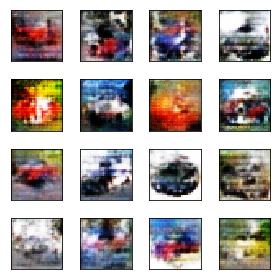

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.09it/s]


At epoch: 72/200,
Discriminator Loss: 2.4260 
Generator Loss: 4.5032


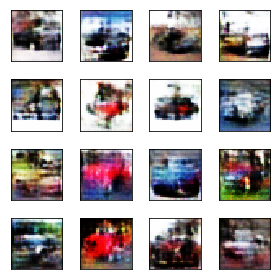

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.55it/s]


At epoch: 73/200,
Discriminator Loss: 2.4835 
Generator Loss: 4.2896


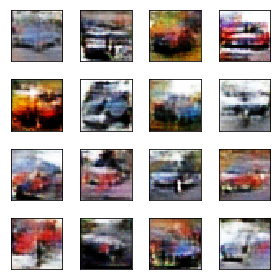

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  4.15it/s]


At epoch: 74/200,
Discriminator Loss: 1.4255 
Generator Loss: 3.6892


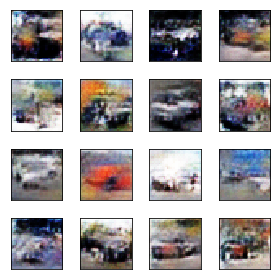

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.39it/s]


At epoch: 75/200,
Discriminator Loss: 2.7648 
Generator Loss: 3.7369


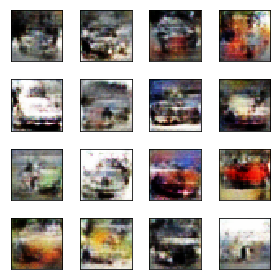

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.10it/s]


At epoch: 76/200,
Discriminator Loss: 1.9433 
Generator Loss: 3.6659


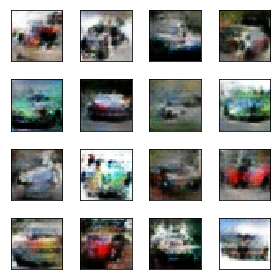

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.30it/s]


At epoch: 77/200,
Discriminator Loss: 2.7295 
Generator Loss: 4.2281


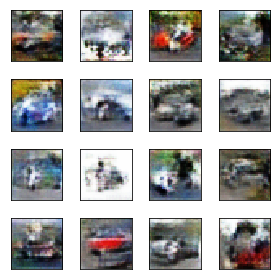

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.62it/s]


At epoch: 78/200,
Discriminator Loss: 2.0772 
Generator Loss: 4.0502


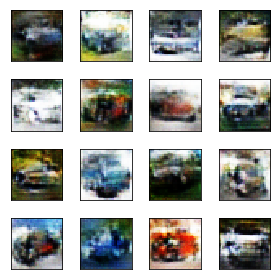

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.60it/s]


At epoch: 79/200,
Discriminator Loss: 1.7490 
Generator Loss: 3.4998


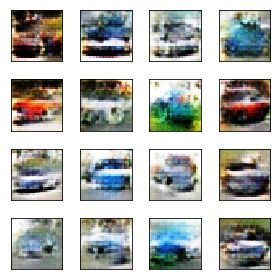

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.64it/s]


At epoch: 80/200,
Discriminator Loss: 1.7885 
Generator Loss: 3.3746


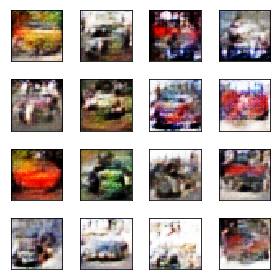

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.08it/s]


At epoch: 81/200,
Discriminator Loss: 2.1108 
Generator Loss: 4.1125


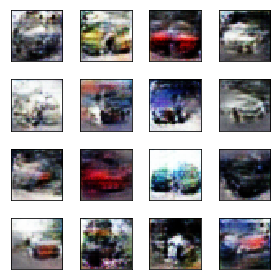

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.43it/s]


At epoch: 82/200,
Discriminator Loss: 1.9008 
Generator Loss: 3.9779


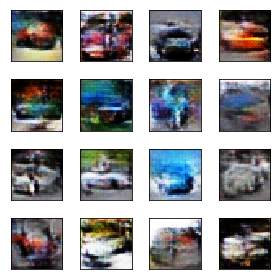

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.67it/s]


At epoch: 83/200,
Discriminator Loss: 2.2190 
Generator Loss: 3.8314


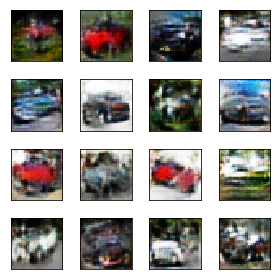

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.25it/s]


At epoch: 84/200,
Discriminator Loss: 2.5946 
Generator Loss: 4.2274


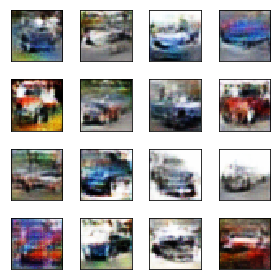

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.49it/s]


At epoch: 85/200,
Discriminator Loss: 1.6747 
Generator Loss: 4.8481


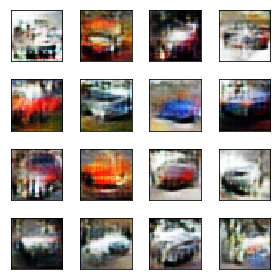

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.65it/s]


At epoch: 86/200,
Discriminator Loss: 2.6799 
Generator Loss: 3.8275


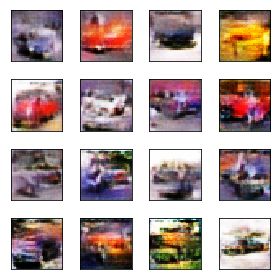

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.29it/s]


At epoch: 87/200,
Discriminator Loss: 2.1769 
Generator Loss: 3.6204


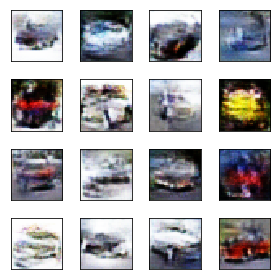

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  3.54it/s]


At epoch: 88/200,
Discriminator Loss: 2.6786 
Generator Loss: 3.8632


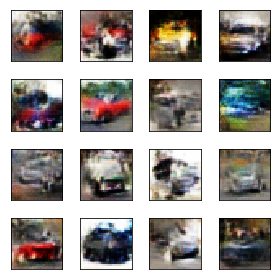

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.25it/s]


At epoch: 89/200,
Discriminator Loss: 2.3158 
Generator Loss: 3.5808


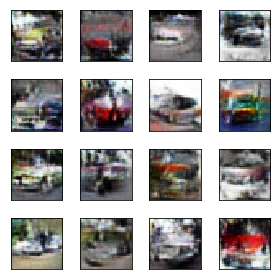

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.38it/s]


At epoch: 90/200,
Discriminator Loss: 2.5150 
Generator Loss: 3.8397


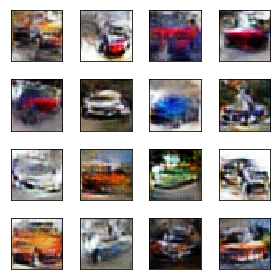

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.35it/s]


At epoch: 91/200,
Discriminator Loss: 2.5645 
Generator Loss: 4.8916


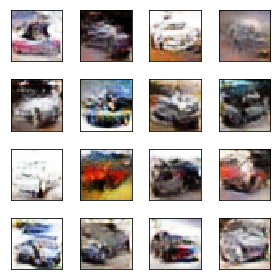

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.30it/s]


At epoch: 92/200,
Discriminator Loss: 4.8761 
Generator Loss: 5.9718


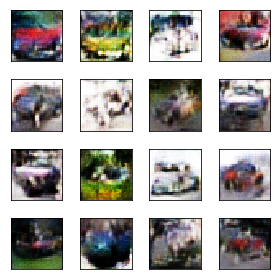

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.23it/s]


At epoch: 93/200,
Discriminator Loss: 1.8791 
Generator Loss: 2.3257


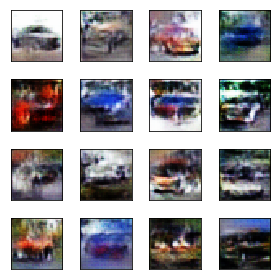

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  3.96it/s]


At epoch: 94/200,
Discriminator Loss: 2.1321 
Generator Loss: 3.4045


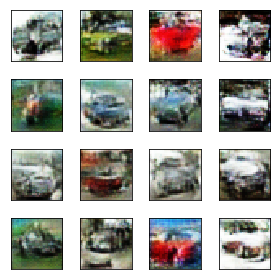

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.45it/s]


At epoch: 95/200,
Discriminator Loss: 1.9050 
Generator Loss: 3.6212


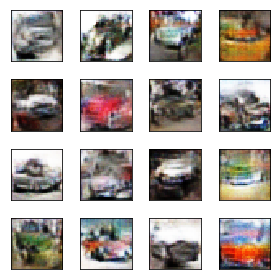

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.83it/s]


At epoch: 96/200,
Discriminator Loss: 2.3974 
Generator Loss: 3.7331


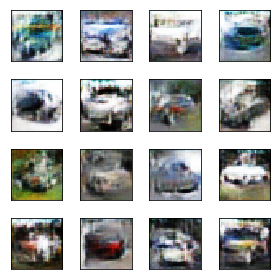

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.38it/s]


At epoch: 97/200,
Discriminator Loss: 1.5823 
Generator Loss: 2.4829


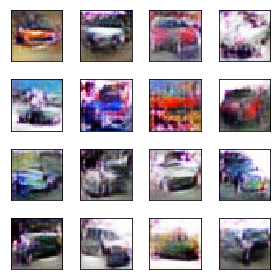

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.49it/s]


At epoch: 98/200,
Discriminator Loss: 2.2229 
Generator Loss: 2.9957


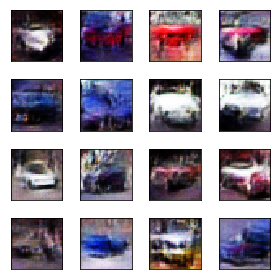

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.46it/s]


At epoch: 99/200,
Discriminator Loss: 2.2296 
Generator Loss: 3.4811


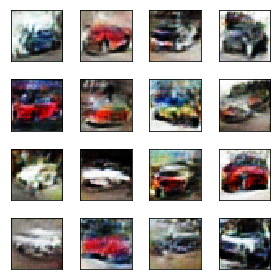

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.47it/s]


At epoch:100/200,
Discriminator Loss: 2.4965 
Generator Loss: 3.9671


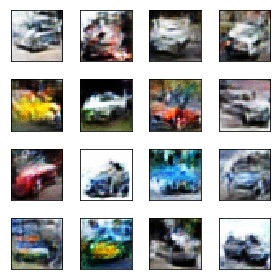

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.52it/s]


At epoch:101/200,
Discriminator Loss: 2.1571 
Generator Loss: 3.5121


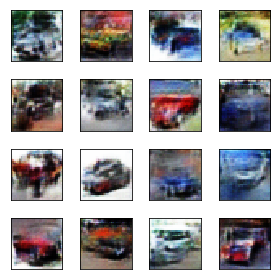

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.33it/s]


At epoch:102/200,
Discriminator Loss: 2.4689 
Generator Loss: 3.7833


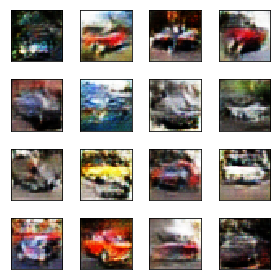

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.40it/s]


At epoch:103/200,
Discriminator Loss: 2.4300 
Generator Loss: 3.8277


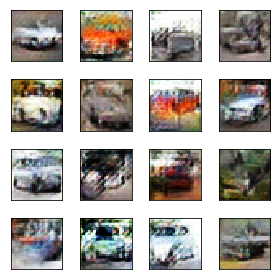

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.40it/s]


At epoch:104/200,
Discriminator Loss: 3.6841 
Generator Loss: 4.4042


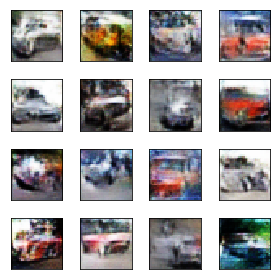

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.41it/s]


At epoch:105/200,
Discriminator Loss: 3.4011 
Generator Loss: 4.7771


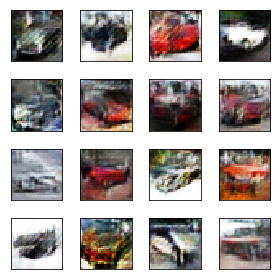

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.39it/s]


At epoch:106/200,
Discriminator Loss: 1.8742 
Generator Loss: 2.6405


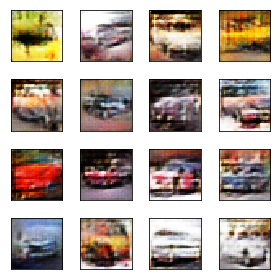

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.34it/s]


At epoch:107/200,
Discriminator Loss: 2.5943 
Generator Loss: 3.3954


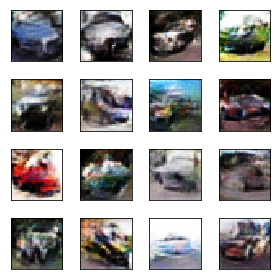

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.32it/s]


At epoch:108/200,
Discriminator Loss: 2.8191 
Generator Loss: 4.1380


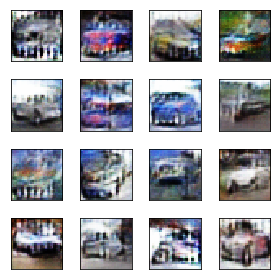

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.43it/s]


At epoch:109/200,
Discriminator Loss: 2.7688 
Generator Loss: 3.9201


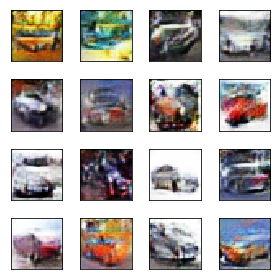

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  3.77it/s]


At epoch:110/200,
Discriminator Loss: 2.6799 
Generator Loss: 5.5004


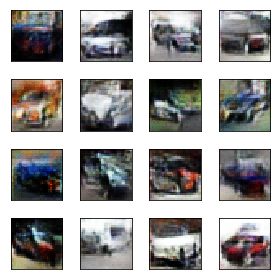

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.63it/s]


At epoch:111/200,
Discriminator Loss: 2.5078 
Generator Loss: 4.0132


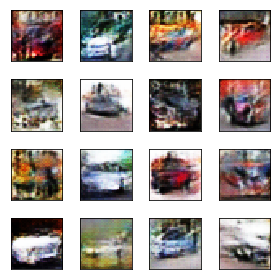

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.76it/s]


At epoch:112/200,
Discriminator Loss: 2.1968 
Generator Loss: 4.0458


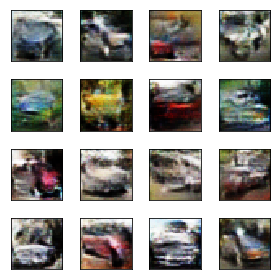

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.58it/s]


At epoch:113/200,
Discriminator Loss: 2.6929 
Generator Loss: 4.3483


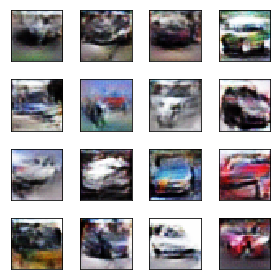

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.41it/s]


At epoch:114/200,
Discriminator Loss: 2.8804 
Generator Loss: 4.3434


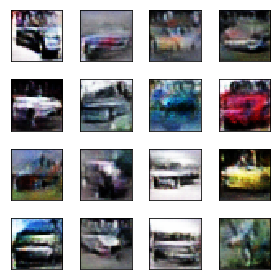

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.75it/s]


At epoch:115/200,
Discriminator Loss: 2.9108 
Generator Loss: 4.1179


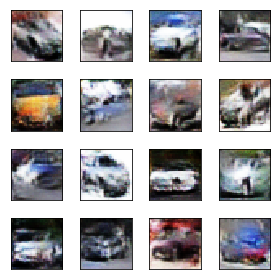

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.22it/s]


At epoch:116/200,
Discriminator Loss: 2.8839 
Generator Loss: 4.0292


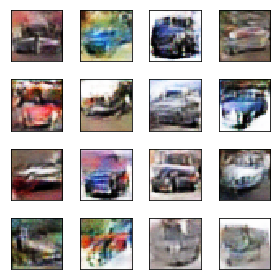

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  3.77it/s]


At epoch:117/200,
Discriminator Loss: 1.3226 
Generator Loss: 2.4534


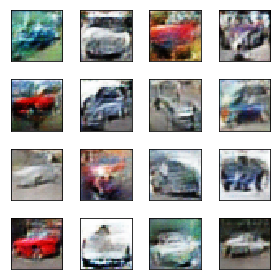

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.80it/s]


At epoch:118/200,
Discriminator Loss: 2.6866 
Generator Loss: 3.8136


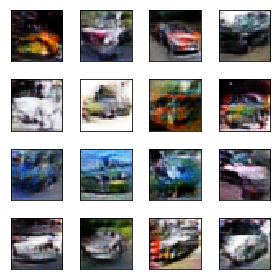

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.61it/s]


At epoch:119/200,
Discriminator Loss: 1.8820 
Generator Loss: 3.5576


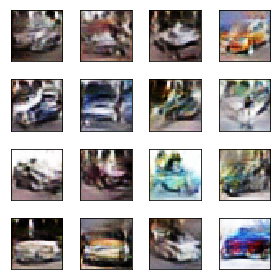

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.57it/s]


At epoch:120/200,
Discriminator Loss: 3.2520 
Generator Loss: 4.1053


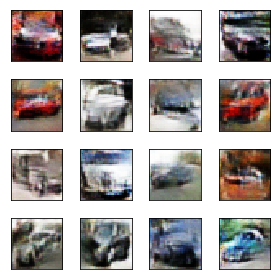

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.58it/s]


At epoch:121/200,
Discriminator Loss: 2.6920 
Generator Loss: 4.0856


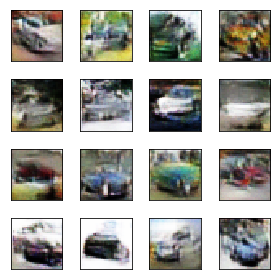

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.73it/s]


At epoch:122/200,
Discriminator Loss: 2.8090 
Generator Loss: 4.4355


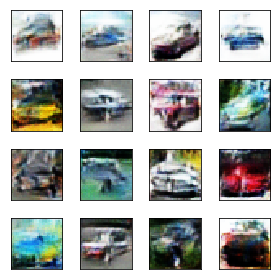

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.49it/s]


At epoch:123/200,
Discriminator Loss: 2.3054 
Generator Loss: 3.4945


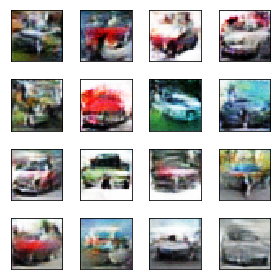

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.56it/s]


At epoch:124/200,
Discriminator Loss: 2.4814 
Generator Loss: 4.0657


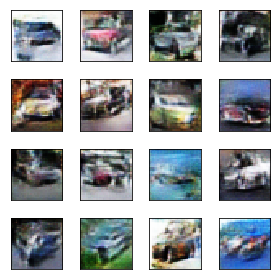

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.60it/s]


At epoch:125/200,
Discriminator Loss: 3.2972 
Generator Loss: 4.6188


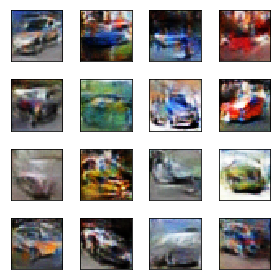

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.40it/s]


At epoch:126/200,
Discriminator Loss: 2.8402 
Generator Loss: 4.2388


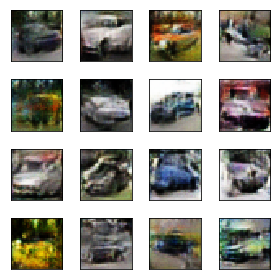

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.77it/s]


At epoch:127/200,
Discriminator Loss: 2.0621 
Generator Loss: 2.9794


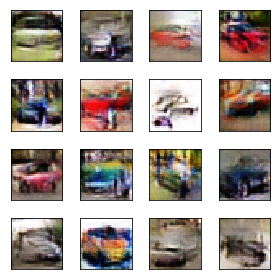

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.72it/s]


At epoch:128/200,
Discriminator Loss: 2.3631 
Generator Loss: 3.6214


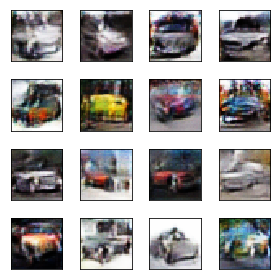

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.57it/s]


At epoch:129/200,
Discriminator Loss: 2.5124 
Generator Loss: 3.4669


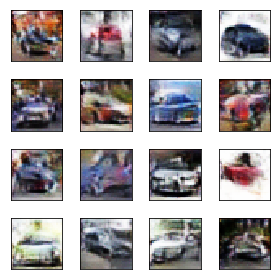

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  3.95it/s]


At epoch:130/200,
Discriminator Loss: 2.7010 
Generator Loss: 4.1245


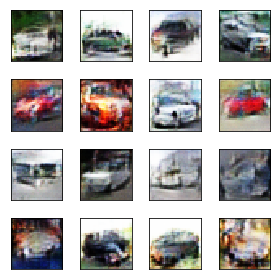

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.17it/s]


At epoch:131/200,
Discriminator Loss: 2.5957 
Generator Loss: 3.6519


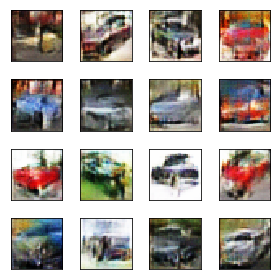

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.69it/s]


At epoch:132/200,
Discriminator Loss: 2.4454 
Generator Loss: 3.5180


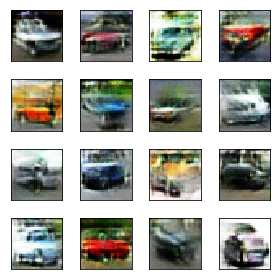

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.38it/s]


At epoch:133/200,
Discriminator Loss: 2.8136 
Generator Loss: 4.3455


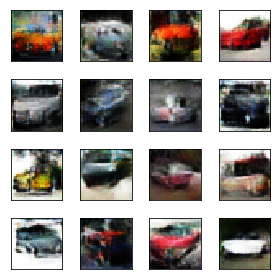

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.29it/s]


At epoch:134/200,
Discriminator Loss: 2.4553 
Generator Loss: 4.5051


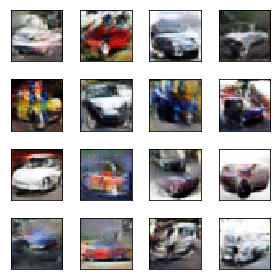

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.27it/s]


At epoch:135/200,
Discriminator Loss: 3.1751 
Generator Loss: 3.7857


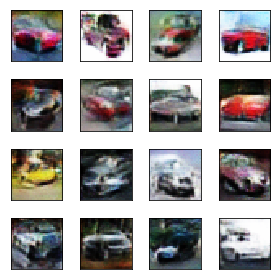

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.39it/s]


At epoch:136/200,
Discriminator Loss: 2.5568 
Generator Loss: 3.1648


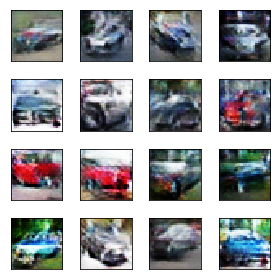

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.28it/s]


At epoch:137/200,
Discriminator Loss: 2.8052 
Generator Loss: 3.4427


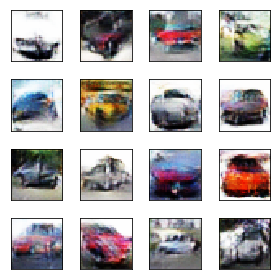

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.58it/s]


At epoch:138/200,
Discriminator Loss: 2.8236 
Generator Loss: 3.5473


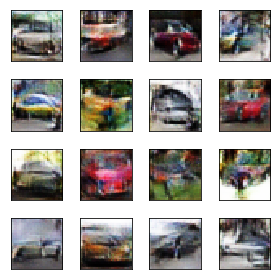

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.61it/s]


At epoch:139/200,
Discriminator Loss: 2.9934 
Generator Loss: 4.0666


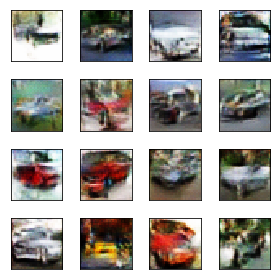

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.39it/s]


At epoch:140/200,
Discriminator Loss: 3.9927 
Generator Loss: 4.6974


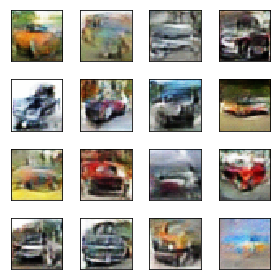

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.75it/s]


At epoch:141/200,
Discriminator Loss: 1.8673 
Generator Loss: 2.3158


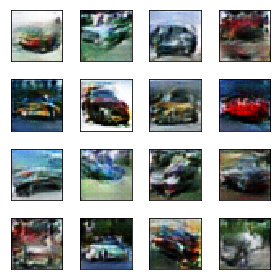

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.65it/s]


At epoch:142/200,
Discriminator Loss: 2.9618 
Generator Loss: 3.0929


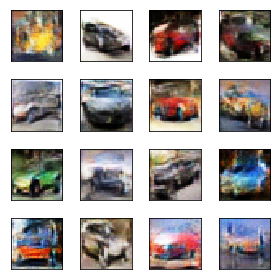

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.62it/s]


At epoch:143/200,
Discriminator Loss: 3.3191 
Generator Loss: 4.3370


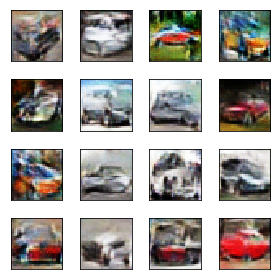

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  4.41it/s]


At epoch:144/200,
Discriminator Loss: 3.3976 
Generator Loss: 4.3619


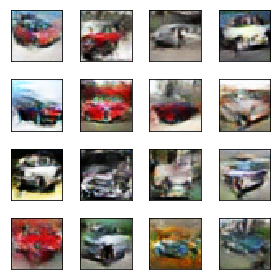

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.26it/s]


At epoch:145/200,
Discriminator Loss: 2.6305 
Generator Loss: 3.7784


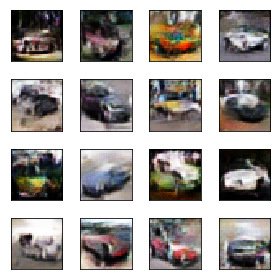

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.48it/s]


At epoch:146/200,
Discriminator Loss: 2.5948 
Generator Loss: 3.9957


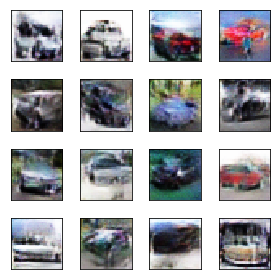

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.72it/s]


At epoch:147/200,
Discriminator Loss: 2.9267 
Generator Loss: 4.0380


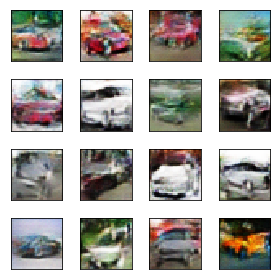

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.36it/s]


At epoch:148/200,
Discriminator Loss: 3.7397 
Generator Loss: 4.1948


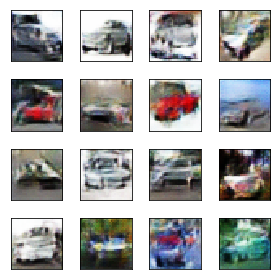

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.73it/s]


At epoch:149/200,
Discriminator Loss: 3.2244 
Generator Loss: 4.0072


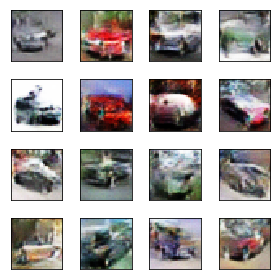

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.45it/s]


At epoch:150/200,
Discriminator Loss: 1.9940 
Generator Loss: 2.3673


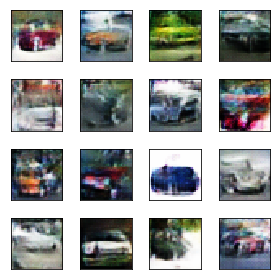

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.69it/s]


At epoch:151/200,
Discriminator Loss: 3.3996 
Generator Loss: 4.3540


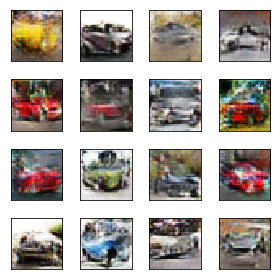

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.54it/s]


At epoch:152/200,
Discriminator Loss: 3.9372 
Generator Loss: 4.4213


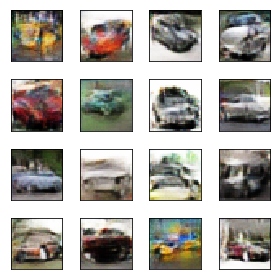

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.66it/s]


At epoch:153/200,
Discriminator Loss: 3.8112 
Generator Loss: 4.1755


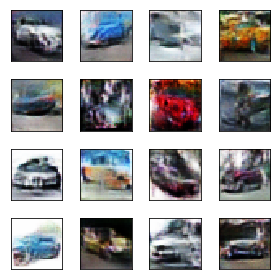

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.37it/s]


At epoch:154/200,
Discriminator Loss: 2.6299 
Generator Loss: 3.8017


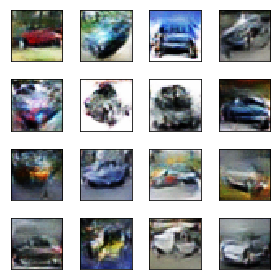

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.36it/s]


At epoch:155/200,
Discriminator Loss: 3.0009 
Generator Loss: 3.9432


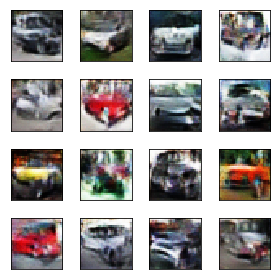

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.19it/s]


At epoch:156/200,
Discriminator Loss: 2.5597 
Generator Loss: 3.4567


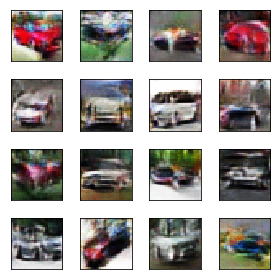

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:13<00:00,  4.04it/s]


At epoch:157/200,
Discriminator Loss: 2.4213 
Generator Loss: 3.9415


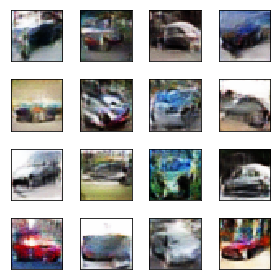

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  3.54it/s]


At epoch:158/200,
Discriminator Loss: 2.1651 
Generator Loss: 2.2239


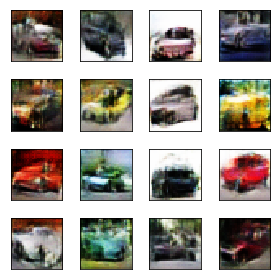

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:11<00:00,  3.59it/s]


At epoch:159/200,
Discriminator Loss: 3.3092 
Generator Loss: 3.8548


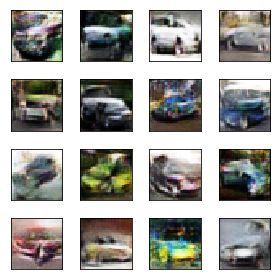

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:11<00:00,  3.63it/s]


At epoch:160/200,
Discriminator Loss: 3.2672 
Generator Loss: 4.4270


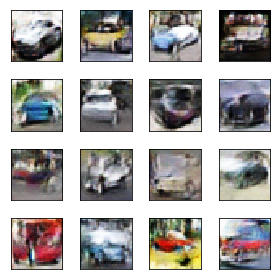

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.18it/s]


At epoch:161/200,
Discriminator Loss: 3.5673 
Generator Loss: 4.2549


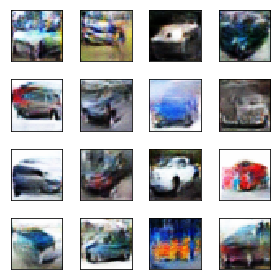

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:12<00:00,  3.06it/s]


At epoch:162/200,
Discriminator Loss: 2.9722 
Generator Loss: 4.3631


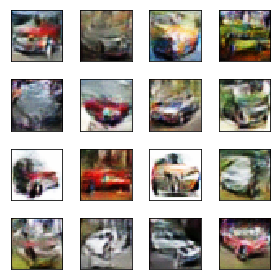

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  3.92it/s]


At epoch:163/200,
Discriminator Loss: 3.6557 
Generator Loss: 4.4137


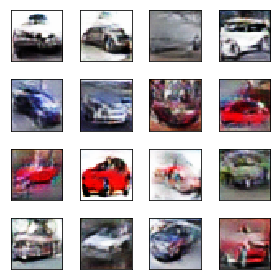

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.65it/s]


At epoch:164/200,
Discriminator Loss: 3.0494 
Generator Loss: 4.7169


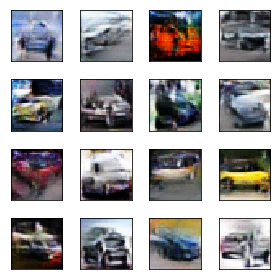

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.27it/s]


At epoch:165/200,
Discriminator Loss: 2.3471 
Generator Loss: 3.4132


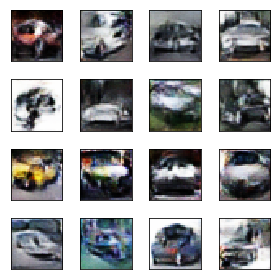

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.62it/s]


At epoch:166/200,
Discriminator Loss: 2.7421 
Generator Loss: 4.3916


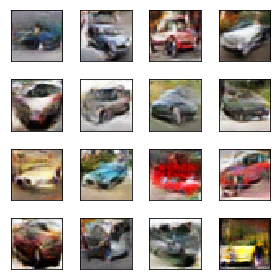

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.43it/s]


At epoch:167/200,
Discriminator Loss: 2.9142 
Generator Loss: 4.0490


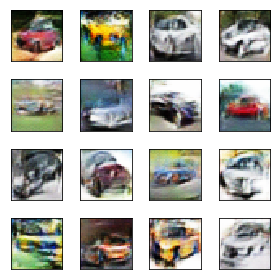

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.38it/s]


At epoch:168/200,
Discriminator Loss: 3.2071 
Generator Loss: 4.1585


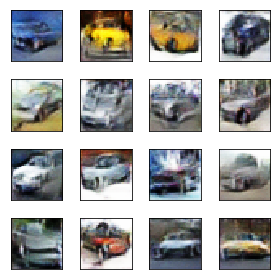

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  3.43it/s]


At epoch:169/200,
Discriminator Loss: 2.9706 
Generator Loss: 4.0089


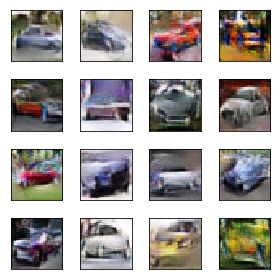

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.30it/s]


At epoch:170/200,
Discriminator Loss: 2.9730 
Generator Loss: 4.6015


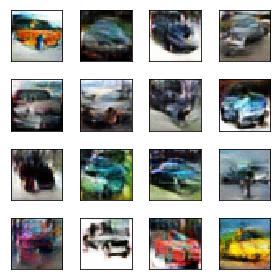

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.58it/s]


At epoch:171/200,
Discriminator Loss: 2.7953 
Generator Loss: 4.6530


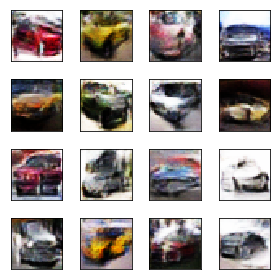

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.70it/s]


At epoch:172/200,
Discriminator Loss: 3.6440 
Generator Loss: 4.3912


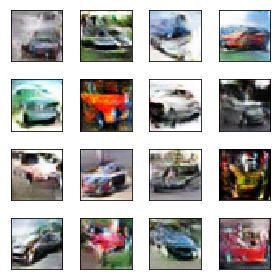

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.08it/s]


At epoch:173/200,
Discriminator Loss: 3.2203 
Generator Loss: 4.0622


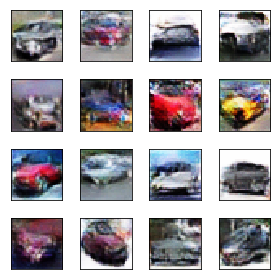

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  3.95it/s]


At epoch:174/200,
Discriminator Loss: 3.3798 
Generator Loss: 4.4398


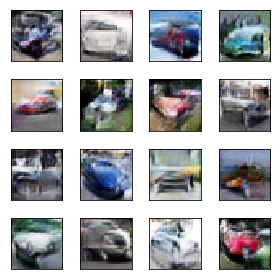

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.32it/s]


At epoch:175/200,
Discriminator Loss: 3.8859 
Generator Loss: 5.5680


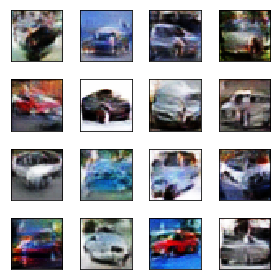

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.47it/s]


At epoch:176/200,
Discriminator Loss: 3.4202 
Generator Loss: 4.2350


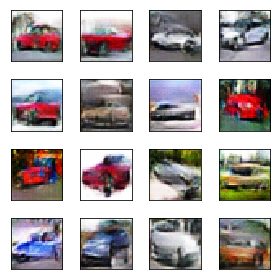

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.53it/s]


At epoch:177/200,
Discriminator Loss: 4.9050 
Generator Loss: 7.5110


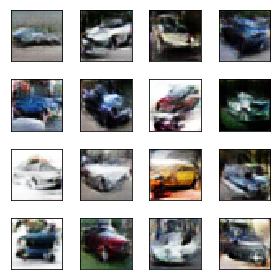

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.23it/s]


At epoch:178/200,
Discriminator Loss: 3.1640 
Generator Loss: 3.7728


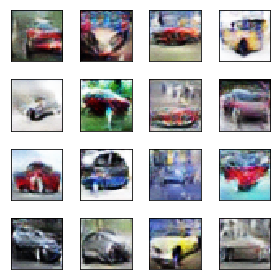

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.65it/s]


At epoch:179/200,
Discriminator Loss: 3.3649 
Generator Loss: 4.6042


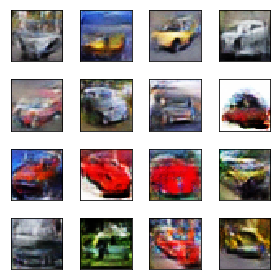

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.16it/s]


At epoch:180/200,
Discriminator Loss: 2.4672 
Generator Loss: 3.9403


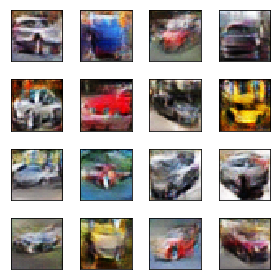

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.65it/s]


At epoch:181/200,
Discriminator Loss: 3.5023 
Generator Loss: 5.2475


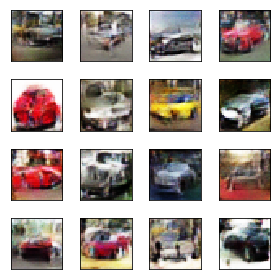

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.44it/s]


At epoch:182/200,
Discriminator Loss: 3.3217 
Generator Loss: 4.2232


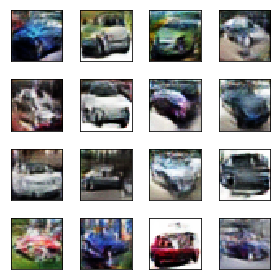

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  4.44it/s]


At epoch:183/200,
Discriminator Loss: 3.2221 
Generator Loss: 4.4543


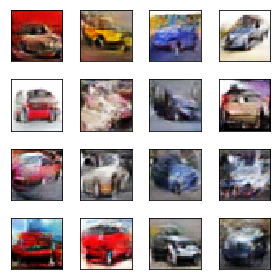

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  3.94it/s]


At epoch:184/200,
Discriminator Loss: 7.3943 
Generator Loss:12.0054


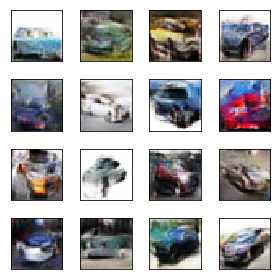

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.77it/s]


At epoch:185/200,
Discriminator Loss: 2.2451 
Generator Loss: 2.4281


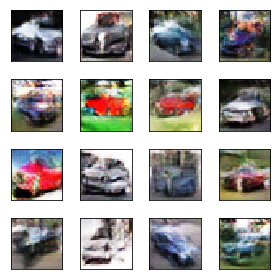

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.32it/s]


At epoch:186/200,
Discriminator Loss: 3.2218 
Generator Loss: 3.7737


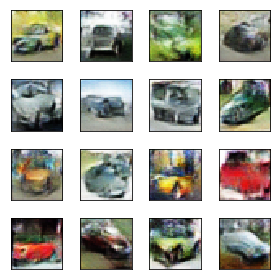

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.42it/s]


At epoch:187/200,
Discriminator Loss: 2.8491 
Generator Loss: 4.0672


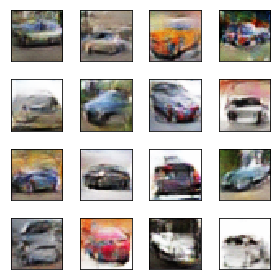

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.62it/s]


At epoch:188/200,
Discriminator Loss: 3.1404 
Generator Loss: 3.8877


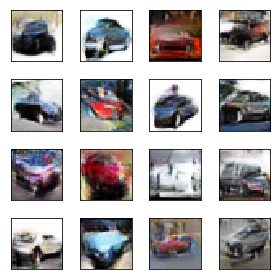

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.62it/s]


At epoch:189/200,
Discriminator Loss: 3.6166 
Generator Loss: 4.2436


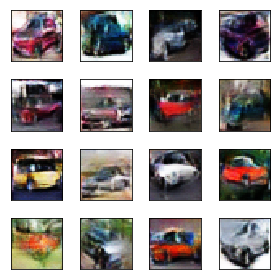

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.71it/s]


At epoch:190/200,
Discriminator Loss: 2.9327 
Generator Loss: 4.2484


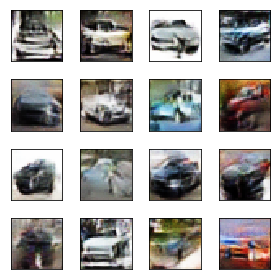

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.57it/s]


At epoch:191/200,
Discriminator Loss: 3.7102 
Generator Loss: 4.0495


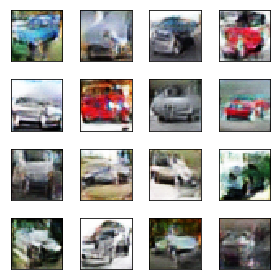

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.88it/s]


At epoch:192/200,
Discriminator Loss: 3.3393 
Generator Loss: 4.1901


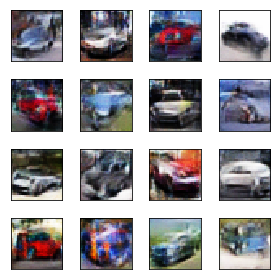

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.28it/s]


At epoch:193/200,
Discriminator Loss: 3.2669 
Generator Loss: 3.1737


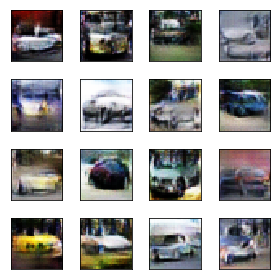

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.55it/s]


At epoch:194/200,
Discriminator Loss: 3.1033 
Generator Loss: 4.0901


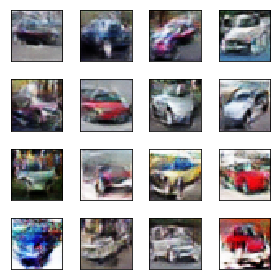

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.06it/s]


At epoch:195/200,
Discriminator Loss: 3.2221 
Generator Loss: 4.2990


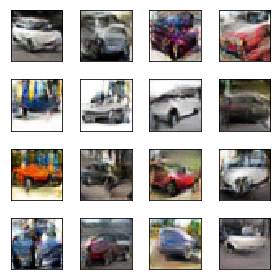

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  3.14it/s]


At epoch:196/200,
Discriminator Loss: 2.9858 
Generator Loss: 3.7893


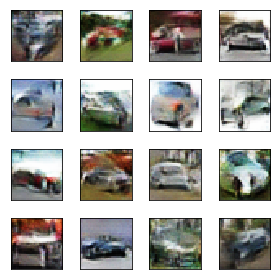

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:11<00:00,  4.10it/s]


At epoch:197/200,
Discriminator Loss: 3.2570 
Generator Loss: 4.4457


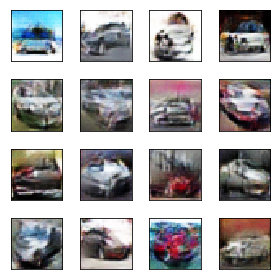

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:10<00:00,  2.64it/s]


At epoch:198/200,
Discriminator Loss: 3.4227 
Generator Loss: 4.3742


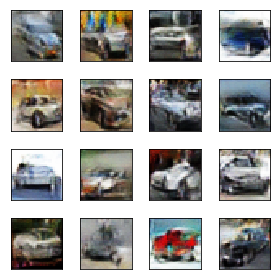

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:09<00:00,  4.06it/s]


At epoch:199/200,
Discriminator Loss: 2.9870 
Generator Loss: 4.0791


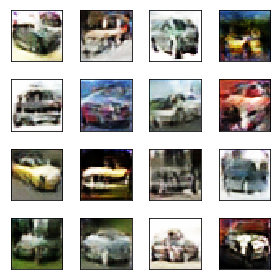

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.90it/s]


At epoch:200/200,
Discriminator Loss: 3.2797 
Generator Loss: 4.4868


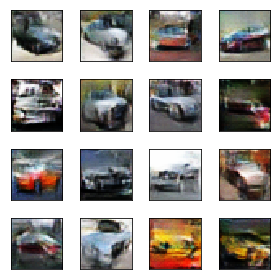

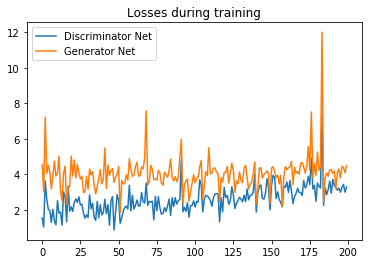

In [23]:
train(g_learning_rate=0.0001, g_beta_1=0.5, d_learning_rate=0.001, d_beta_1=0.5, leaky_alpha=0.2, init_std=0.02)